## Breast Cancer Dataset: Exploratory Data Analysis (EDA)
## Krishna Dave (UID: 905636874)

###  Description
Breast cancer is a malignant type of cancer and has been life threatening for women around the world. With early detection as a non-metastatic disease, breast cancer is curable. Healthcare datasets such as these are highly confidential, but important for analysis and model training that help with early detection. Therefore, exploring the use cases of synthetic data generation for such a dataset is quite beneficial. 

In this notebook, we perform exploratory data analysis (EDA) on the real dataset as well as the synthetically generated datasets from several sources (including GReaT, OpenAI's GPT4, Mostly.AI) to understand the data quality and data distributions, and compare and contrast
between the real dataset and the synthetically generated ones.

### About the dataset

The raw dataset contains the following columns in the data files including:

1. ID (Patient ID)
2. DIAGNOSIS (M: Malignant, B: Benign)
3. RADIUS1
4. TEXTURE1
5. PERIMETER1
6. AREA1
7. SMOOTHNESS1
8. COMPACTNESS1
9. CONCAVITY1
10. CONCAVE_POINTS1
11. SYMMETRY1
12. FRACTAL_DIMENSION1
13. RADIUS2
14. TEXTURE2
15. PERIMETER2
16. AREA2
17. SMOOTHNESS2
18. COMPACTNESS2
19. CONCAVITY2
20. CONCAVE_POINTS2
21. SYMMETRY2
22. FRACTAL_DIMENSION2
23. RADIUS3
24. TEXTURE3
25. PERIMETER3
26. AREA3
27. SMOOTHNESS3
28. COMPACTNESS3
29. CONCAVITY3
30. CONCAVE_POINTS3
31. SYMMETRY3
32. FRACTAL_DIMENSION3

Attribute Information:
* ID number
* Diagnosis (M = malignant, B = benign)

There ten real-valued features are computed for each cell nucleus:
- a) radius (mean of distances from the center to points on the perimeter)
- b) texture (standard deviation of gray-scale values)
- c) perimeter
- d) area
- e) smoothness (local variation in radius lengths)
- f) compactness (perimeter² / area — 1.0)
- g) concavity (severity of concave portions of the contour)
- h) concave points (number of concave portions of the contour)
- i) symmetry
- j) fractal dimension (“coastline approximation” — 1)

### References/Links
- https://github.com/datamole-ai/edvart
- https://github.com/datamole-ai
- https://datamole-ai.github.io/edvart/
- https://github.com/SouRitra01/Exploratory-Data-Analysis-EDA-in-Banking-Python-Project-/blob/main/Proj1_EDA_Pandas_Banking%20(1).ipynb
- https://www.kaggle.com/code/itsmohammadshahid/eda-breast-cancer-prediction
- https://www.kaggle.com/code/shaunthesheep/breast-cancer-wisconsin-eda
- https://medium.com/@shashmikaranam/exploratory-data-analysis-breast-cancer-wisconsin-diagnostic-dataset-6a3be9525cd
- https://medium.com/analytics-vidhya/breast-cancer-diagnostic-dataset-eda-fa0de80f15bd
- https://www.knowledgehut.com/blog/data-science/eda-data-science
- https://towardsdatascience.com/an-extensive-guide-to-exploratory-data-analysis-ddd99a03199e
- https://www.ibm.com/topics/exploratory-data-analysis
- https://www.geeksforgeeks.org/exploratory-data-analysis-eda-types-and-tools/
- https://www.simplilearn.com/tutorials/data-analytics-tutorial/exploratory-data-analysis

In [1]:
# Installing an open-source Python library for exploratory data analysis
!pip3 install edvart


[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: pip install --upgrade pip


In [2]:
import edvart
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Loads data from the input csvPath, assigns it to appropriate data types and returns a dataframe as data type dictionary
def loadBreastCancerData(csvPath: str):
    # Reads the csv file using the input csvPath
    df = pd.read_csv(csvPath, index_col=None)
    
    # Stores the column names of the DataFrame df in the variable cols
    cols = df.columns
    
    # Uses dictionary comprehension to set the data type of the columns to data types of str or float64
    dtype_dict = {"ID": "str", **{col: 'str' for col in cols[1:3]}, **{col: 'float64' for col in cols[3:]}}
    
    # Applies the data type conversions specified in dtype_dict to the DataFrame df
    # The astype() function is used to cast the columns of the DataFrame to specified data types
    df = df.astype(dtype_dict)
    
    return df

In [4]:
# Paths to the data files
breastCancerData_real = "breastcancer_real_labeled_without_explicit_indices.csv"
breastCancerData_mostlyAI = "breastcancer_synthetic_mostlyAI.csv"
breastCancerData_beGreat = "breastcancer_synthetic_beGreat.csv"
breastCancerData_openAIGPT4 = "breastcancer_synthetic_openai_GPT4_data.csv"

## EDA: BeGReaT Synthetic Data

In [5]:
# Checking dimensions and getting more info about the data 
data = loadBreastCancerData(breastCancerData_beGreat)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  569 non-null    object 
 1   DIAGNOSIS           569 non-null    object 
 2   RADIUS1             569 non-null    object 
 3   TEXTURE1            569 non-null    float64
 4   PERIMETER1          569 non-null    float64
 5   AREA1               569 non-null    float64
 6   SMOOTHNESS1         569 non-null    float64
 7   COMPACTNESS1        569 non-null    float64
 8   CONCAVITY1          569 non-null    float64
 9   CONCAVE_POINTS1     569 non-null    float64
 10  SYMMETRY1           569 non-null    float64
 11  FRACTAL_DIMENSION1  569 non-null    float64
 12  RADIUS2             569 non-null    float64
 13  TEXTURE2            569 non-null    float64
 14  PERIMETER2          569 non-null    float64
 15  AREA2               569 non-null    float64
 16  SMOOTHNE

In [7]:
data.head()

,ID,DIAGNOSIS,RADIUS1,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
0,901087.0,B,13.45,19.41,89.78,435.2,0.08020,0.00000,0.00000,0.00000,...,14.80,26.03,96.11,437.5,0.08723,0.0849,0.00000,0.00000,0.2447,0.07748
1,855133.0,B,11.85,16.43,77.88,477.4,0.09858,0.07722,0.01872,0.02777,...,12.96,23.08,82.53,575.1,0.11200,0.0870,0.04232,0.05586,0.2229,0.06783
2,86561.0,B,12.34,18.02,78.59,402.5,0.08477,0.10960,0.03934,0.07957,...,13.67,23.12,87.79,495.1,0.10960,0.3346,0.35970,0.14320,0.2963,0.09614
3,911366.0,B,12.43,23.17,83.24,499.0,0.11420,0.06677,0.07943,0.01111,...,14.87,33.49,102.50,764.7,0.16820,0.1911,0.15630,0.06544,0.2525,0.09519
4,915276.0,B,12.38,15.74,73.40,682.9,0.07941,0.12220,0.02271,0.01113,...,10.96,20.62,82.98,775.8,0.10250,0.1903,0.18030,0.08123,0.2853,0.07698


In [8]:
data.describe()

,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,SYMMETRY1,FRACTAL_DIMENSION1,RADIUS2,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.00000,569.000000,569.000000,569.000000,569.000000
mean,18.804745,87.482162,594.493146,0.095406,0.095423,0.067538,0.039978,0.174035,0.063136,0.344551,...,15.225508,24.724195,100.407680,752.842707,0.129675,0.22461,0.222331,0.100064,0.279593,0.084405
std,3.574427,17.969240,249.226996,0.011671,0.041663,0.055509,0.029963,0.020907,0.006370,0.217207,...,3.414279,5.419382,24.870484,371.487753,0.017856,0.12760,0.164983,0.056556,0.045191,0.016673
min,10.860000,34.160000,181.500000,0.058000,0.000000,0.000000,0.000000,0.121700,0.050430,0.111500,...,8.837000,1.927000,56.120000,184.200000,0.078340,0.00000,0.000000,0.000000,0.155700,0.055040
25%,16.380000,76.490000,446.600000,0.087230,0.066370,0.028630,0.016150,0.159100,0.058660,0.225400,...,13.110000,20.580000,85.000000,515.900000,0.119800,0.13640,0.099360,0.064950,0.251200,0.071980
50%,18.580000,83.740000,531.500000,0.094620,0.086680,0.051820,0.031090,0.172100,0.061850,0.277300,...,14.360000,24.480000,95.000000,632.400000,0.129700,0.18820,0.178900,0.090400,0.275900,0.081340
75%,20.900000,94.870000,661.700000,0.102600,0.120000,0.094790,0.059390,0.186900,0.066640,0.397600,...,16.270000,28.340000,110.300000,830.400000,0.141200,0.29120,0.337800,0.137400,0.305500,0.092510
max,33.360000,142.300000,2073.000000,0.144900,0.372400,0.318900,0.167600,0.257700,0.086770,1.976000,...,30.370000,41.820000,186.200000,2495.000000,0.185100,0.85610,0.916800,0.296500,0.530800,0.173000


In [9]:
## Unique column values
data.apply(lambda x: len(x.unique())).sort_values(ascending=False).head(10)

AREA3           500
AREA1           490
PERIMETER1      487
ID              484
COMPACTNESS3    479
AREA2           475
PERIMETER3      473
CONCAVITY3      467
SMOOTHNESS2     462
TEXTURE3        458
dtype: int64

In [10]:
def createEDAReport(data):
    # Calling loadBreastCancerData to load breast cancer data into a data frame
    df = loadBreastCancerData(data)
    # Create a default report
    report = edvart.DefaultReport(df)
    # Show the report in the current Jupyter notebook
    report.show()
    # Export the report to an HTML file
    #report.export_html("report_breastCancerData_beGreat.html")
    # Export the report to a Jupyter notebook
    # report.export_notebook("report_breastCancerData.ipynb")

# Table of Contents
---

 * [Overview](#f8303780-c990-477a-8346-823c6c227737)

	 * [Quick Info](#d9a5c981-8c0d-4edb-9d38-590bb0f7014e)

	 * [Data Types](#efeeec94-153c-4c5e-a3c9-9e42fa29f0de)

	 * [Data Preview](#902143ef-8913-4363-8fe4-ae949abd7218)

	 * [Missing Values](#a3d35de6-896e-4df9-9df8-e97b0f93b525)

	 * [Rows With Missing Value](#fe4287bd-a2e5-4ed6-8695-0b74454a1c40)

	 * [Constant Occurrence](#73872377-152e-473c-8afc-c9a7d6b0d171)

	 * [Duplicate Rows](#d095e38a-944f-4486-9288-79ffe73bfe6d)

 * [Univariate Analysis](#34d2b453-113d-497b-a7af-86f3becb1191)

 * [Bivariate analysis](#3f1d993e-64b7-4986-810d-5c93d686bf15)

	 * [Correlation Plot](#5bc70824-fd61-4014-9496-3a648ab7aa24)

	 * [Pairplot](#6e0da936-ccf6-4cd2-af66-13919cb994dd)

	 * [Contingency table](#25591712-f3b1-4632-8391-7701136f2b50)

 * [Multivariate analysis](#9a09bf63-8e31-41db-804b-73fcf013f5f5)

	 * [Principal Component Analysis](#02f85f2f-0d79-424f-a506-49935f065938)

	 * [Parallel coordinates](#73cd7e39-cc94-40ff-bf27-462b7440a337)

	 * [Parallel categories](#a6aca5e7-38d8-424a-95fc-22928a5e01df)


# Overview<a id='f8303780-c990-477a-8346-823c6c227737'>
---

## Quick Info<a id='d9a5c981-8c0d-4edb-9d38-590bb0f7014e'>

,
Rows,569
Columns,32
Missing cells,0 (0.00 %)
Zeros,227 (1.25 %)
Duplicate rows,0 (0.00 %)


## Data Types<a id='efeeec94-153c-4c5e-a3c9-9e42fa29f0de'>

Column Name,Inferred Data Type
ID,categorical
DIAGNOSIS,categorical
RADIUS1,categorical
TEXTURE1,numeric
PERIMETER1,numeric
AREA1,numeric
SMOOTHNESS1,numeric
COMPACTNESS1,numeric
CONCAVITY1,numeric
CONCAVE_POINTS1,numeric


## Data Preview<a id='902143ef-8913-4363-8fe4-ae949abd7218'>

### First rows

,ID,DIAGNOSIS,RADIUS1,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
0,901087.0,B,13.45,19.41,89.78,435.2,0.08020,0.00000,0.00000,0.00000,...,14.80,26.03,96.11,437.5,0.08723,0.0849,0.00000,0.00000,0.2447,0.07748
1,855133.0,B,11.85,16.43,77.88,477.4,0.09858,0.07722,0.01872,0.02777,...,12.96,23.08,82.53,575.1,0.11200,0.0870,0.04232,0.05586,0.2229,0.06783
2,86561.0,B,12.34,18.02,78.59,402.5,0.08477,0.10960,0.03934,0.07957,...,13.67,23.12,87.79,495.1,0.10960,0.3346,0.35970,0.14320,0.2963,0.09614
3,911366.0,B,12.43,23.17,83.24,499.0,0.11420,0.06677,0.07943,0.01111,...,14.87,33.49,102.50,764.7,0.16820,0.1911,0.15630,0.06544,0.2525,0.09519
4,915276.0,B,12.38,15.74,73.40,682.9,0.07941,0.12220,0.02271,0.01113,...,10.96,20.62,82.98,775.8,0.10250,0.1903,0.18030,0.08123,0.2853,0.07698


### Last rows

,ID,DIAGNOSIS,RADIUS1,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
564,857343.0,B,13.88,17.46,61.30,491.9,0.09906,0.06949,0.03990,0.01069,...,12.28,27.33,69.85,380.2,0.1226,0.1149,0.07722,0.06956,0.3108,0.07924
565,897604.0,B,12.91,20.37,86.61,428.6,0.10890,0.10100,0.04972,0.02277,...,13.26,33.04,96.41,523.0,0.1641,0.1087,0.06874,0.03264,0.2459,0.10720
566,922264.0,B,13.65,17.31,87.30,528.9,0.10890,0.15640,0.21350,0.10150,...,14.26,22.38,98.00,677.4,0.1565,0.8561,0.87990,0.18170,0.3175,0.10710
567,898678.0,M,16.31,17.84,122.80,461.1,0.08772,0.05831,0.08370,0.05397,...,19.85,22.09,152.10,585.6,0.1284,0.1692,0.24290,0.12160,0.2879,0.07944
568,9010667.0,B,10.76,16.34,65.25,390.9,0.08481,0.12050,0.09077,0.02647,...,11.27,17.88,71.10,376.6,0.1053,0.2758,0.29850,0.08507,0.2743,0.08950


### Sample

,ID,DIAGNOSIS,RADIUS1,TEXTURE1,PERIMETER1,AREA1,SMOOTHNESS1,COMPACTNESS1,CONCAVITY1,CONCAVE_POINTS1,...,RADIUS3,TEXTURE3,PERIMETER3,AREA3,SMOOTHNESS3,COMPACTNESS3,CONCAVITY3,CONCAVE_POINTS3,SYMMETRY3,FRACTAL_DIMENSION3
472,91115.0,M,19.62,19.06,126.10,1028.0,0.10310,0.13890,0.09732,0.05252,...,24.90,24.49,162.00,1227.0,0.14130,0.24240,0.22360,0.16960,0.3087,0.09870
179,868999.0,B,11.91,20.52,83.74,489.8,0.07393,0.06685,0.00000,0.00000,...,13.18,24.04,86.77,567.3,0.12000,0.09981,0.00000,0.00000,0.2763,0.05737
129,855132.0,B,12.98,22.04,70.39,477.5,0.08917,0.07950,0.02880,0.01167,...,13.06,34.13,72.09,521.5,0.09911,0.16460,0.14930,0.08160,0.2695,0.07127
139,869224.0,B,10.34,21.80,78.95,446.6,0.09383,0.03972,0.04505,0.02657,...,11.80,30.83,84.04,544.3,0.09847,0.10740,0.10490,0.08543,0.2784,0.07330
335,859465.0,B,13.22,20.52,88.44,534.3,0.09087,0.04362,0.09453,0.01734,...,15.67,24.07,97.11,762.0,0.10890,0.17750,0.09453,0.05000,0.2437,0.09952


## Missing Values<a id='a3d35de6-896e-4df9-9df8-e97b0f93b525'>

There are no missing values


## Rows With Missing Value<a id='fe4287bd-a2e5-4ed6-8695-0b74454a1c40'>

There are no missing values


## Constant Occurrence<a id='73872377-152e-473c-8afc-c9a7d6b0d171'>

Column Name,0 Count,0 %
CONCAVE_POINTS3,42,7.381
CONCAVE_POINTS1,37,6.503
CONCAVITY1,36,6.327
CONCAVITY3,36,6.327
CONCAVE_POINTS2,34,5.975
CONCAVITY2,34,5.975
COMPACTNESS2,4,0.703
COMPACTNESS1,3,0.527
COMPACTNESS3,1,0.176
SMOOTHNESS3,0,0.000


## Duplicate Rows<a id='d095e38a-944f-4486-9288-79ffe73bfe6d'>

There are no duplicated rows


# Univariate Analysis<a id='34d2b453-113d-497b-a7af-86f3becb1191'>
---

## *ID - categorical*

,
901315.0,6 (1.05 %)
89812.0,4 (0.70 %)
858970.0,4 (0.70 %)
905520.0,4 (0.70 %)
892604.0,4 (0.70 %)
Other values count,547 (96.13 %)
Null,0 (0.00 %)


Number of unique values is greater than 50, not plotting bar plot.

---

## *DIAGNOSIS - categorical*

,
B,408 (71.70 %)
M,161 (28.30 %)
Other values count,0 (0.00 %)
Null,0 (0.00 %)


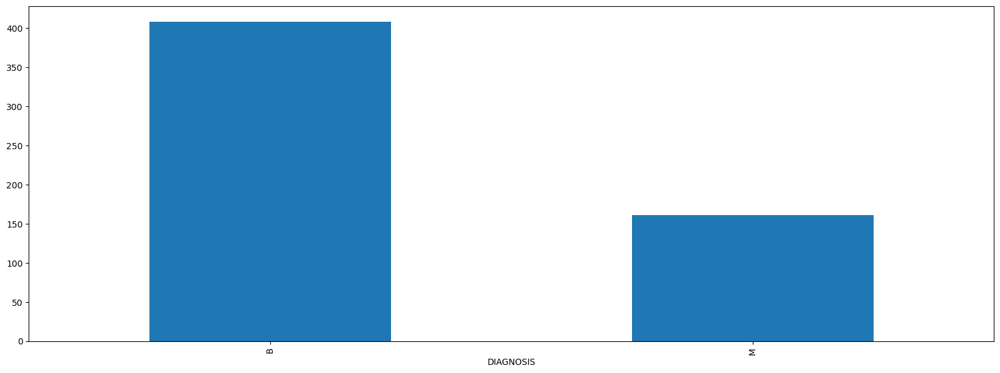

---

## *RADIUS1 - categorical*

,
12.34,9 (1.58 %)
13.46,7 (1.23 %)
13.67,6 (1.05 %)
12.35,6 (1.05 %)
13.1,6 (1.05 %)
Other values count,535 (94.02 %)
Null,0 (0.00 %)


Number of unique values is greater than 50, not plotting bar plot.

---

## *TEXTURE1 - numeric*

,
Number of unique values,416
Sum,10 699.90
Mean,18.80
Mode,16.34
Standard deviation,3.57
Mean absolute deviation,2.79
Median absolute deviation,2.33
Coefficient of variation,0.19
Kurtosis,0.53
Skewness,0.59


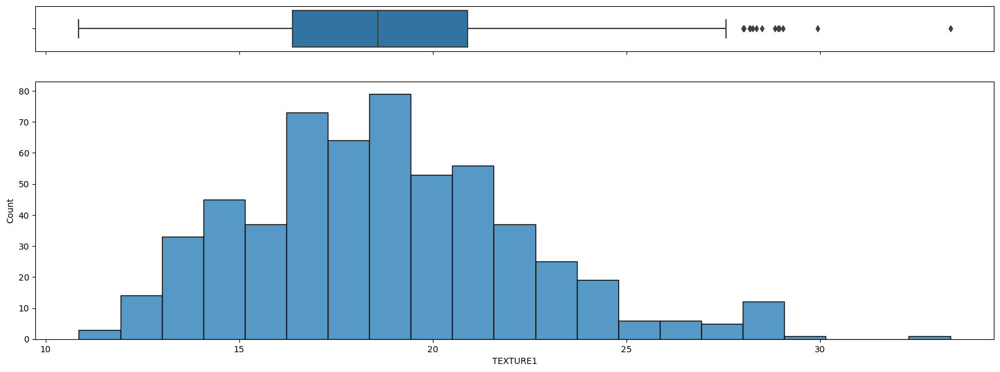

---

## *PERIMETER1 - numeric*

,
Number of unique values,487
Sum,49 777.35
Mean,87.48
Mode,130.0
Standard deviation,17.97
Mean absolute deviation,13.39
Median absolute deviation,9.83
Coefficient of variation,0.21
Kurtosis,0.85
Skewness,0.94


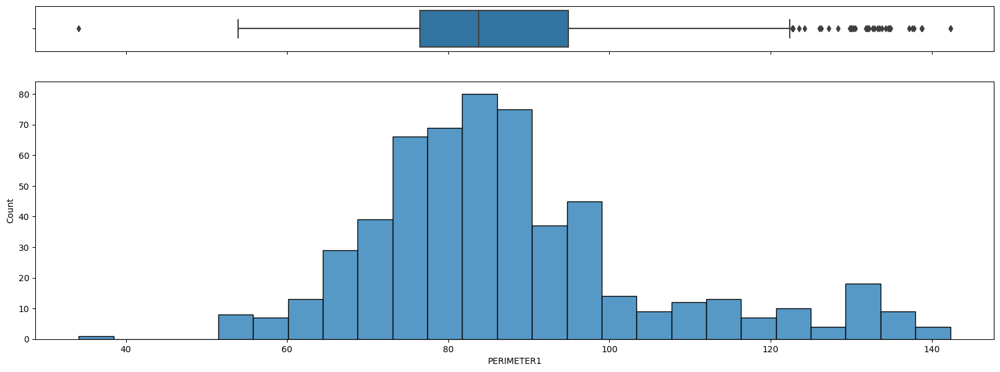

---

## *AREA1 - numeric*

,
Number of unique values,490
Sum,338 266.60
Mean,594.49
Mode,366.90
Standard deviation,249.23
Mean absolute deviation,176.64
Median absolute deviation,127.79
Coefficient of variation,0.42
Kurtosis,3.77
Skewness,1.73


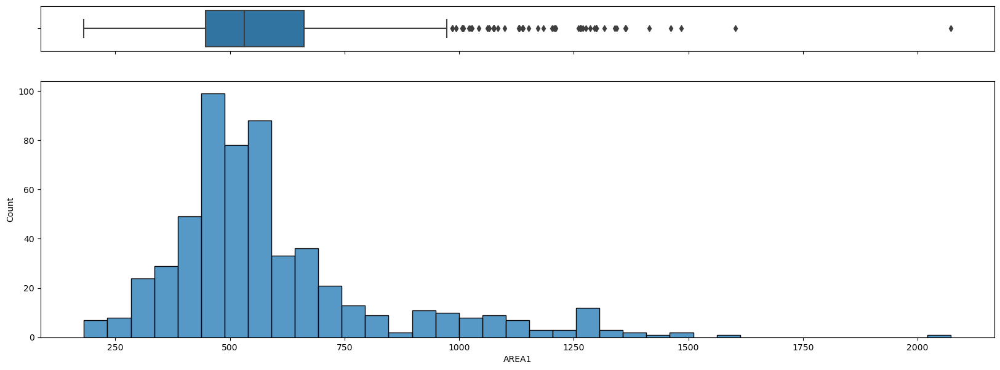

---

## *SMOOTHNESS1 - numeric*

,
Number of unique values,339
Sum,54.29
Mean,0.10
Mode,0.09
Standard deviation,0.01
Mean absolute deviation,0.01
Median absolute deviation,0.01
Coefficient of variation,0.12
Kurtosis,1.01
Skewness,0.51


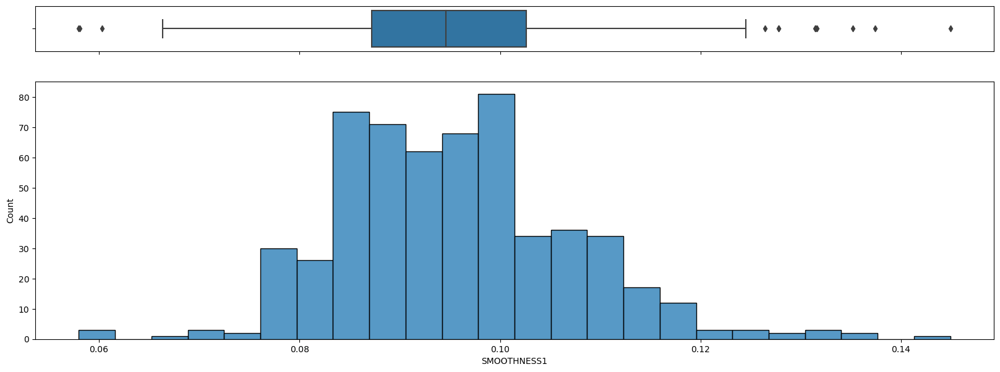

---

## *COMPACTNESS1 - numeric*

,
Number of unique values,448
Sum,54.30
Mean,0.10
Mode,0.08
Standard deviation,0.04
Mean absolute deviation,0.03
Median absolute deviation,0.03
Coefficient of variation,0.44
Kurtosis,4.88
Skewness,1.43


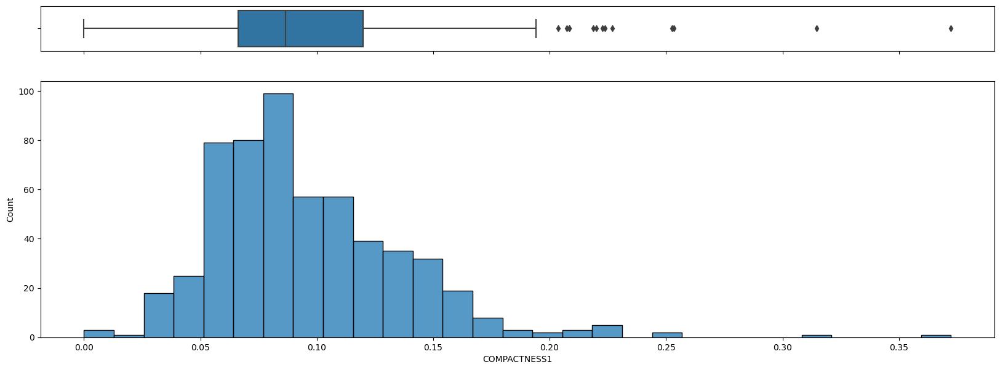

---

## *CONCAVITY1 - numeric*

,
Number of unique values,443
Sum,38.43
Mean,0.07
Mode,0.0
Standard deviation,0.06
Mean absolute deviation,0.04
Median absolute deviation,0.04
Coefficient of variation,0.82
Kurtosis,1.68
Skewness,1.27


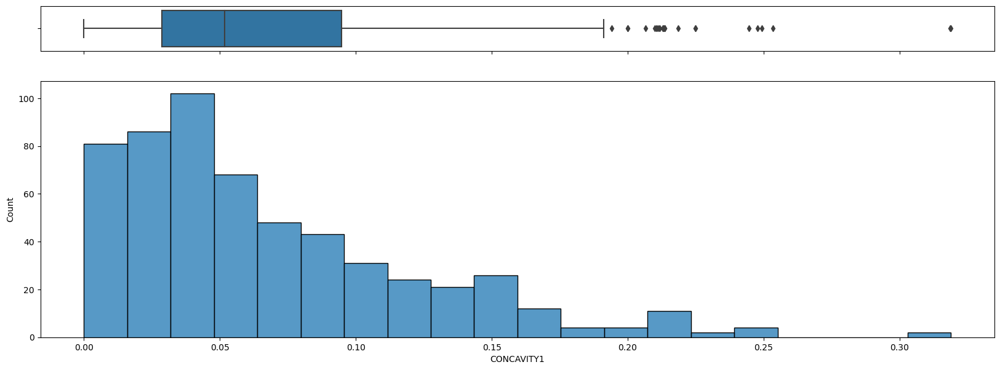

---

## *CONCAVE_POINTS1 - numeric*

,
Number of unique values,435
Sum,22.75
Mean,0.04
Mode,0.0
Standard deviation,0.03
Mean absolute deviation,0.02
Median absolute deviation,0.02
Coefficient of variation,0.75
Kurtosis,0.38
Skewness,0.88


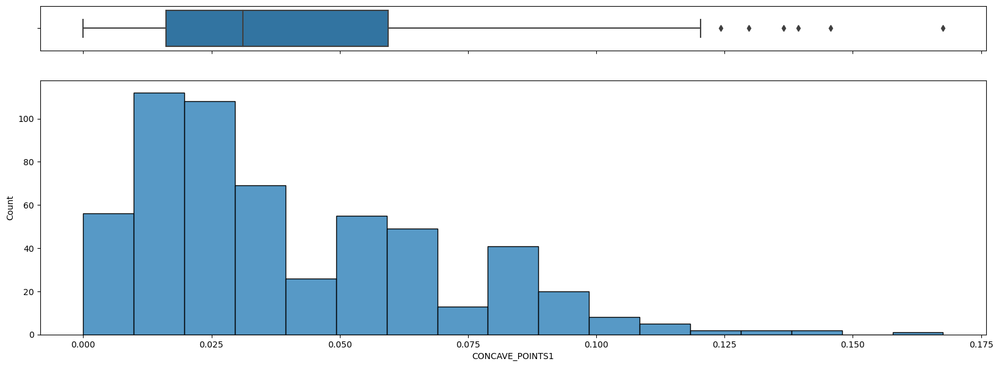

---

## *SYMMETRY1 - numeric*

,
Number of unique values,312
Sum,99.03
Mean,0.17
Mode,0.16
Standard deviation,0.02
Mean absolute deviation,0.02
Median absolute deviation,0.01
Coefficient of variation,0.12
Kurtosis,0.72
Skewness,0.62


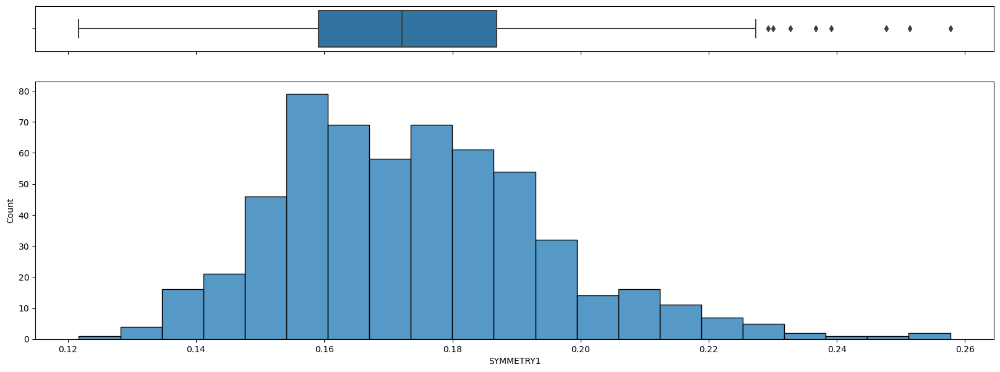

---

## *FRACTAL_DIMENSION1 - numeric*

,
Number of unique values,332
Sum,35.92
Mean,0.06
Mode,0.06
Standard deviation,0.01
Mean absolute deviation,0.00
Median absolute deviation,0.00
Coefficient of variation,0.10
Kurtosis,1.03
Skewness,1.01


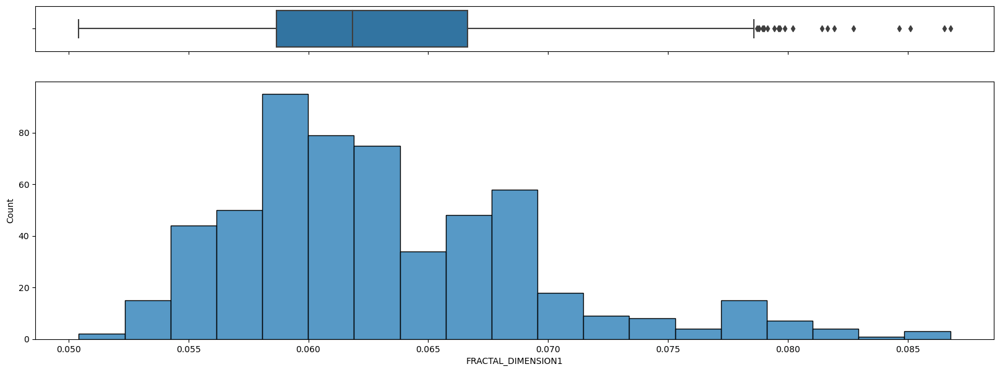

---

## *RADIUS2 - numeric*

,
Number of unique values,428
Sum,196.05
Mean,0.34
Mode,0.23
Standard deviation,0.22
Mean absolute deviation,0.14
Median absolute deviation,0.11
Coefficient of variation,0.63
Kurtosis,17.67
Skewness,3.39


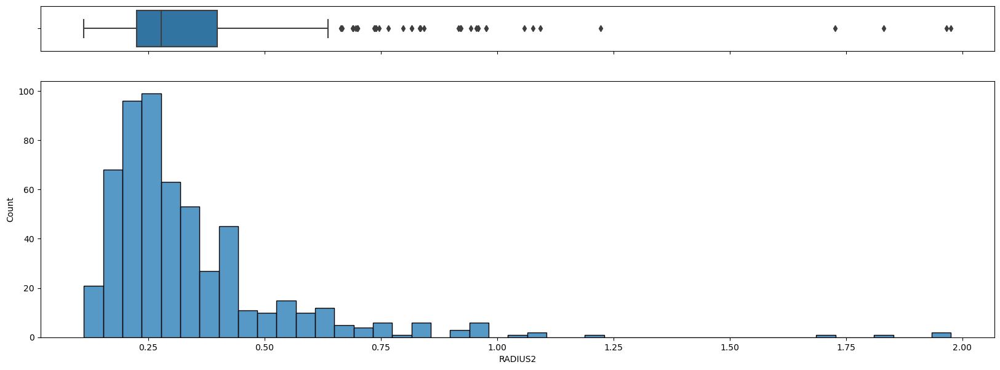

---

## *TEXTURE2 - numeric*

,
Number of unique values,352
Sum,666.84
Mean,1.17
Mode,0.86
Standard deviation,0.50
Mean absolute deviation,0.37
Median absolute deviation,0.30
Coefficient of variation,0.42
Kurtosis,3.47
Skewness,1.55


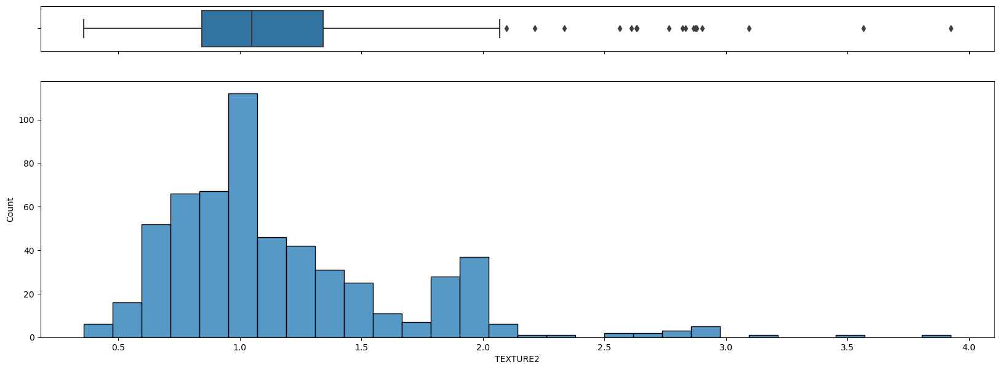

---

## *PERIMETER2 - numeric*

,
Number of unique values,310
Sum,1 390.48
Mean,2.44
Mode,2.87
Standard deviation,1.20
Mean absolute deviation,0.82
Median absolute deviation,0.58
Coefficient of variation,0.49
Kurtosis,8.38
Skewness,2.49


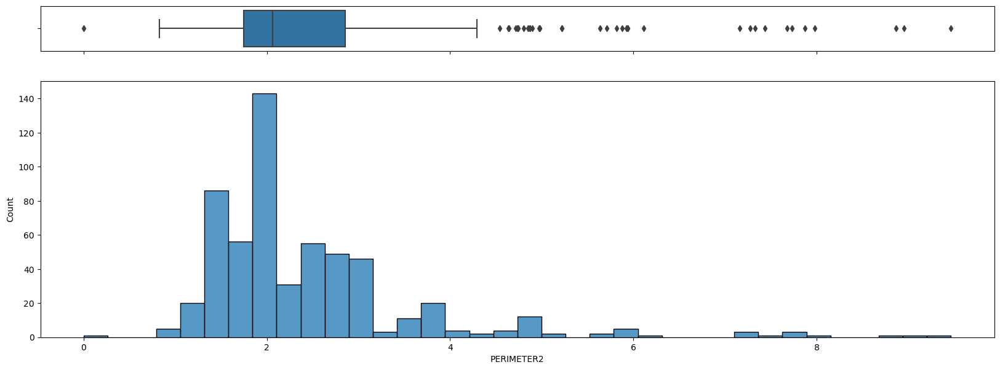

---

## *AREA2 - numeric*

,
Number of unique values,475
Sum,16 062.95
Mean,28.23
Mode,19.18
Standard deviation,22.01
Mean absolute deviation,13.35
Median absolute deviation,9.42
Coefficient of variation,0.78
Kurtosis,19.93
Skewness,3.70


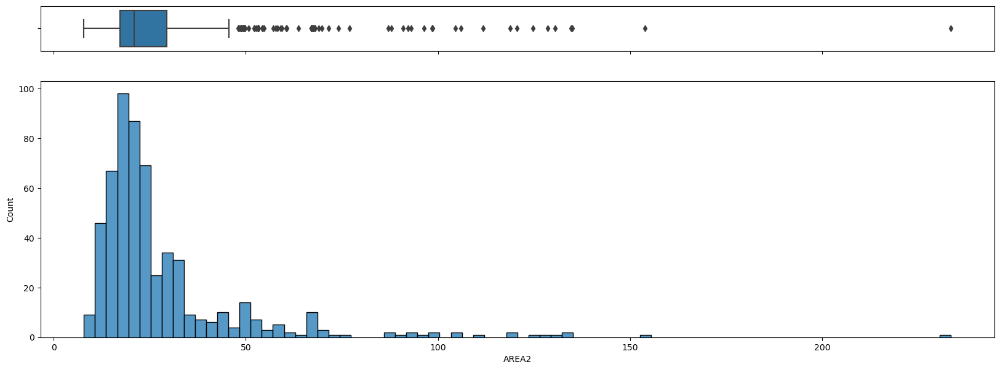

---

## *SMOOTHNESS2 - numeric*

,
Number of unique values,462
Sum,3.61
Mean,0.01
Mode,0.01
Standard deviation,0.00
Mean absolute deviation,0.00
Median absolute deviation,0.00
Coefficient of variation,0.31
Kurtosis,0.95
Skewness,0.99


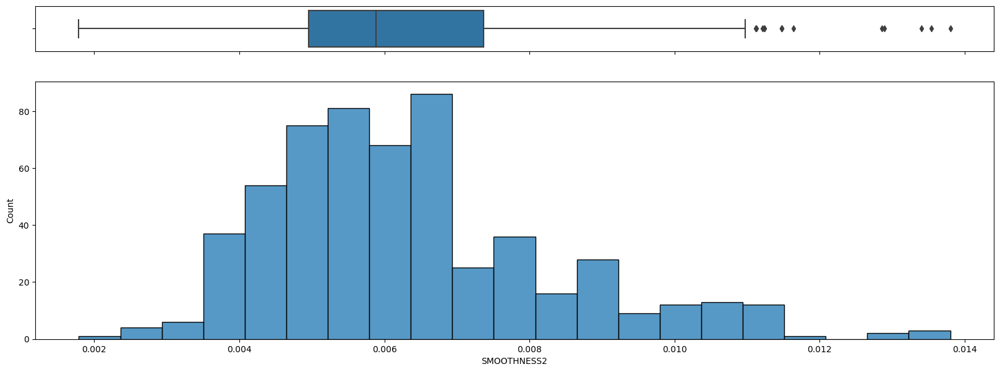

---

## *COMPACTNESS2 - numeric*

,
Number of unique values,408
Sum,12.36
Mean,0.02
Mode,0.01
Standard deviation,0.02
Mean absolute deviation,0.01
Median absolute deviation,0.01
Coefficient of variation,0.69
Kurtosis,7.58
Skewness,2.23


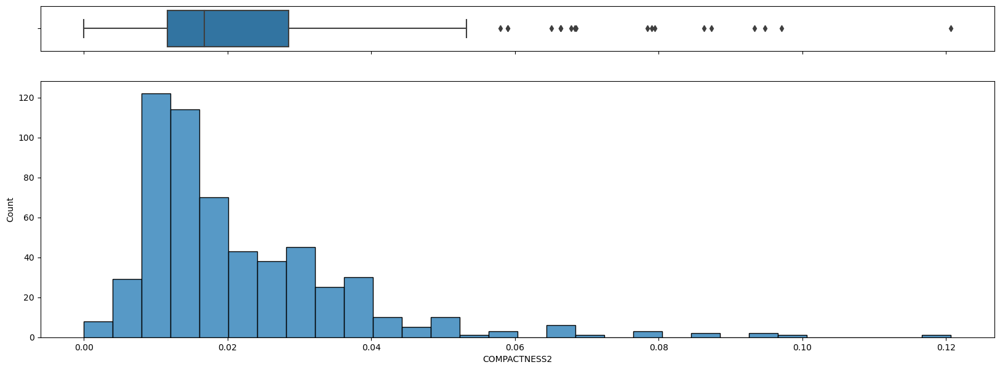

---

## *CONCAVITY2 - numeric*

,
Number of unique values,402
Sum,14.78
Mean,0.03
Mode,0.0
Standard deviation,0.03
Mean absolute deviation,0.02
Median absolute deviation,0.01
Coefficient of variation,1.00
Kurtosis,143.71
Skewness,8.97


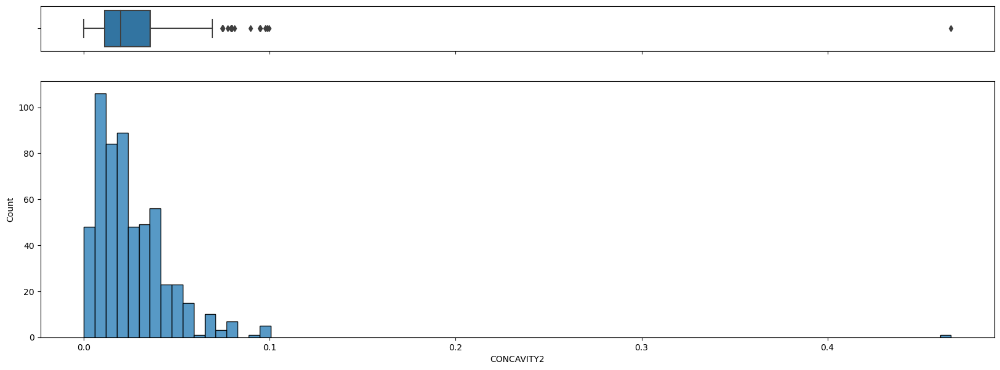

---

## *CONCAVE_POINTS2 - numeric*

,
Number of unique values,374
Sum,5.66
Mean,0.01
Mode,0.0
Standard deviation,0.00
Mean absolute deviation,0.00
Median absolute deviation,0.00
Coefficient of variation,0.47
Kurtosis,5.20
Skewness,0.84


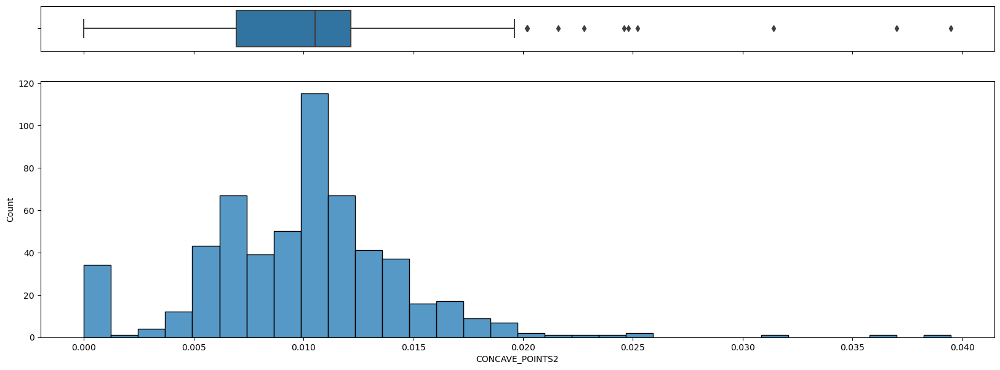

---

## *SYMMETRY2 - numeric*

,
Number of unique values,324
Sum,10.83
Mean,0.02
Mode,0.01
Standard deviation,0.01
Mean absolute deviation,0.00
Median absolute deviation,0.00
Coefficient of variation,0.34
Kurtosis,24.87
Skewness,3.49


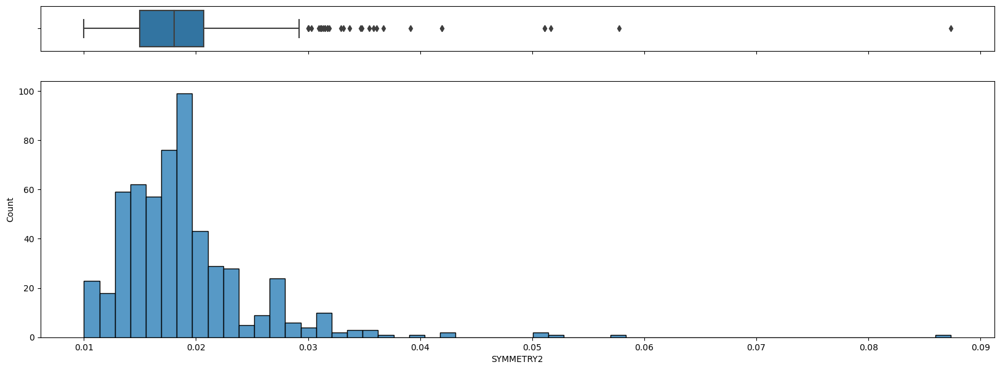

---

## *FRACTAL_DIMENSION2 - numeric*

,
Number of unique values,455
Sum,1.84
Mean,0.00
Mode,0.00
Standard deviation,0.00
Mean absolute deviation,0.00
Median absolute deviation,0.00
Coefficient of variation,0.54
Kurtosis,28.77
Skewness,3.72


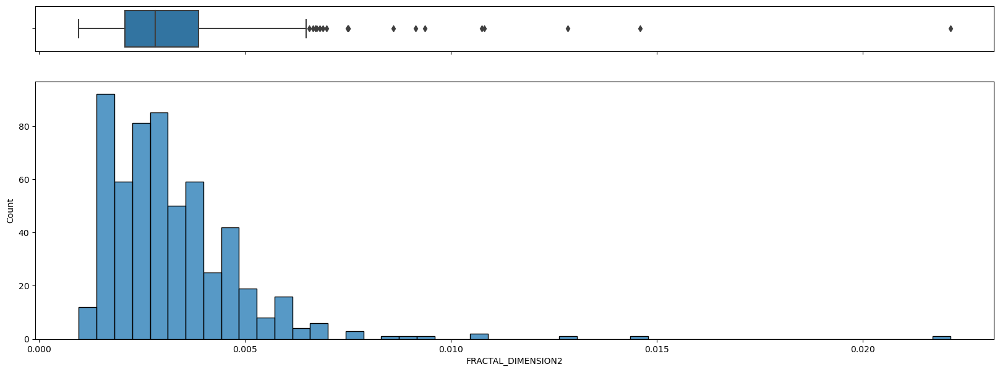

---

## *RADIUS3 - numeric*

,
Number of unique values,361
Sum,8 663.31
Mean,15.23
Mode,13.06
Standard deviation,3.41
Mean absolute deviation,2.52
Median absolute deviation,1.97
Coefficient of variation,0.22
Kurtosis,1.73
Skewness,1.30


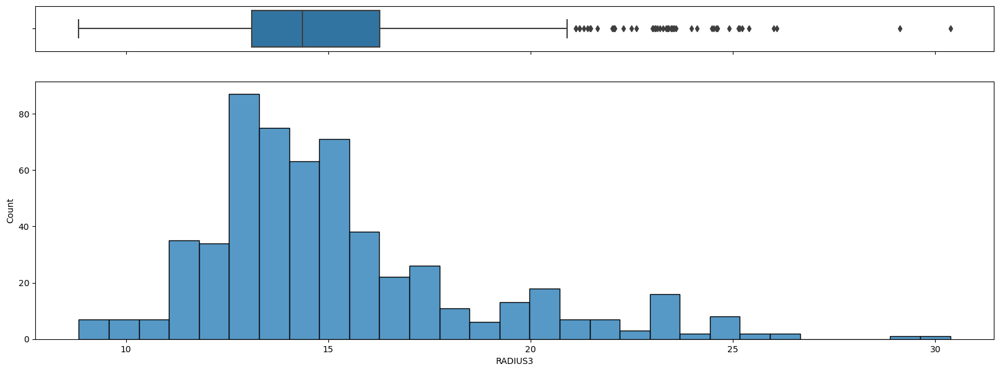

---

## *TEXTURE3 - numeric*

,
Number of unique values,458
Sum,14 068.07
Mean,24.72
Mode,22.03
Standard deviation,5.42
Mean absolute deviation,4.41
Median absolute deviation,3.91
Coefficient of variation,0.22
Kurtosis,-0.06
Skewness,0.17


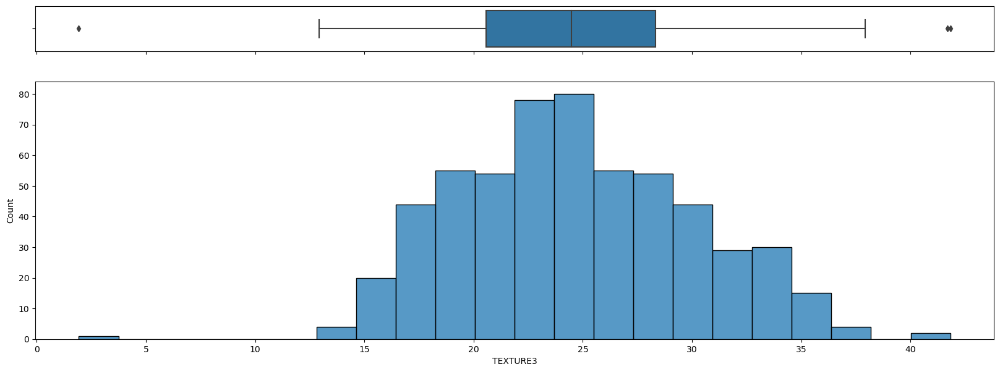

---

## *PERIMETER3 - numeric*

,
Number of unique values,473
Sum,57 131.97
Mean,100.41
Mode,101.40
Standard deviation,24.87
Mean absolute deviation,18.68
Median absolute deviation,14.26
Coefficient of variation,0.25
Kurtosis,1.23
Skewness,1.18


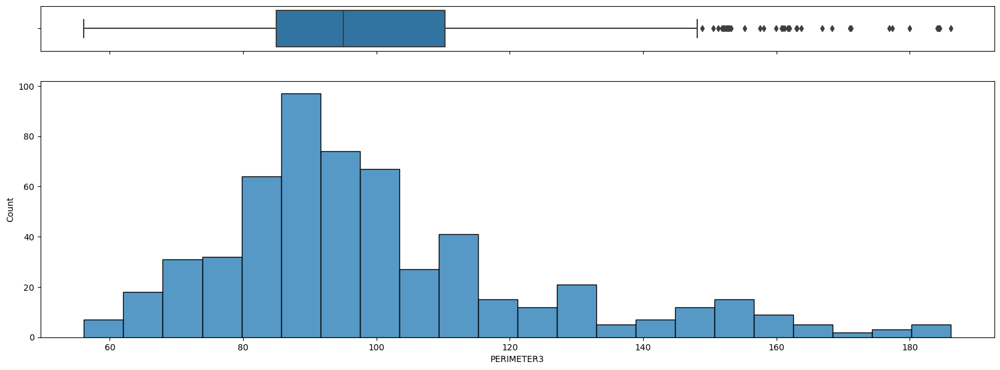

---

## *AREA3 - numeric*

,
Number of unique values,500
Sum,428 367.50
Mean,752.84
Mode,633.70
Standard deviation,371.49
Mean absolute deviation,270.07
Median absolute deviation,215.04
Coefficient of variation,0.49
Kurtosis,2.93
Skewness,1.71


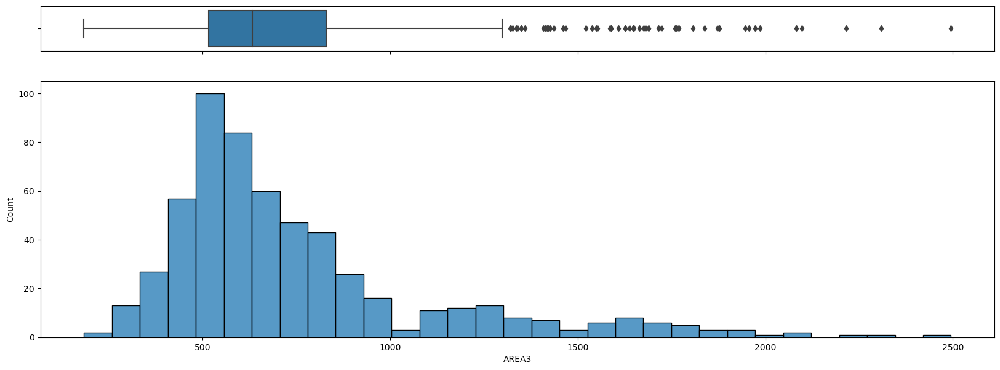

---

## *SMOOTHNESS3 - numeric*

,
Number of unique values,303
Sum,73.78
Mean,0.13
Mode,0.14
Standard deviation,0.02
Mean absolute deviation,0.01
Median absolute deviation,0.01
Coefficient of variation,0.14
Kurtosis,0.41
Skewness,-0.04


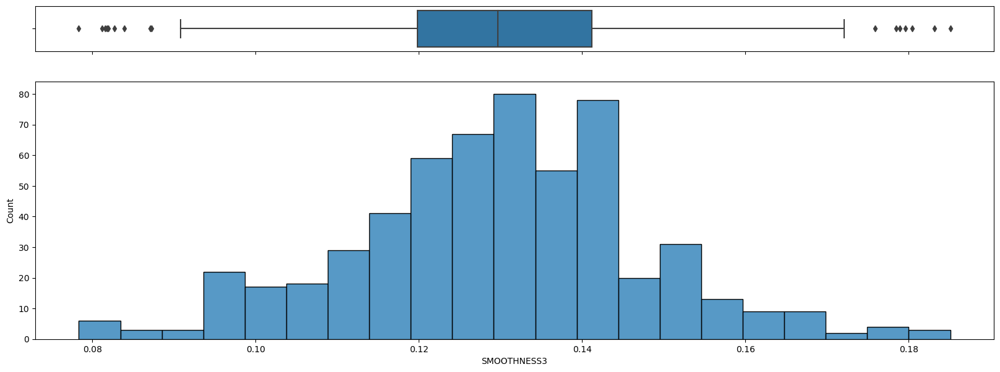

---

## *COMPACTNESS3 - numeric*

,
Number of unique values,479
Sum,127.80
Mean,0.22
Mode,0.19
Standard deviation,0.13
Mean absolute deviation,0.10
Median absolute deviation,0.08
Coefficient of variation,0.57
Kurtosis,2.55
Skewness,1.36


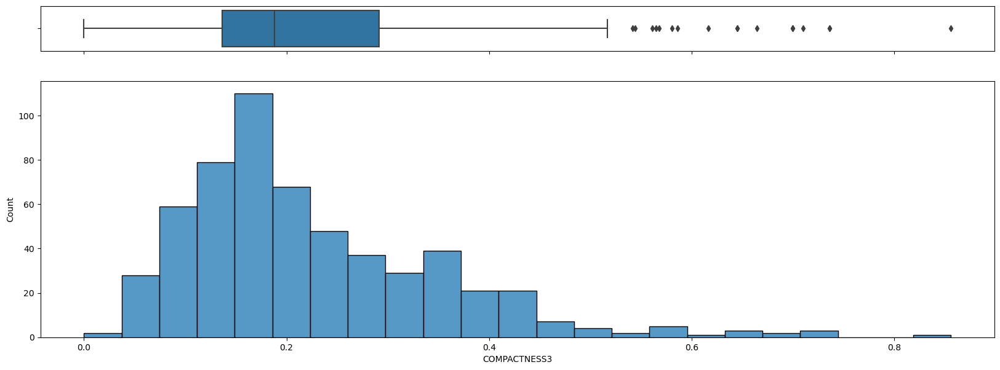

---

## *CONCAVITY3 - numeric*

,
Number of unique values,467
Sum,126.51
Mean,0.22
Mode,0.0
Standard deviation,0.16
Mean absolute deviation,0.13
Median absolute deviation,0.12
Coefficient of variation,0.74
Kurtosis,0.93
Skewness,0.98


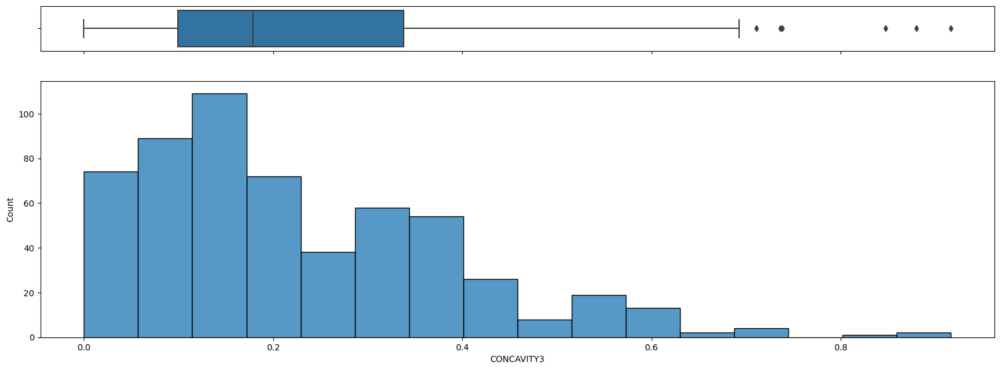

---

## *CONCAVE_POINTS3 - numeric*

,
Number of unique values,430
Sum,56.94
Mean,0.10
Mode,0.0
Standard deviation,0.06
Mean absolute deviation,0.04
Median absolute deviation,0.04
Coefficient of variation,0.57
Kurtosis,0.28
Skewness,0.43


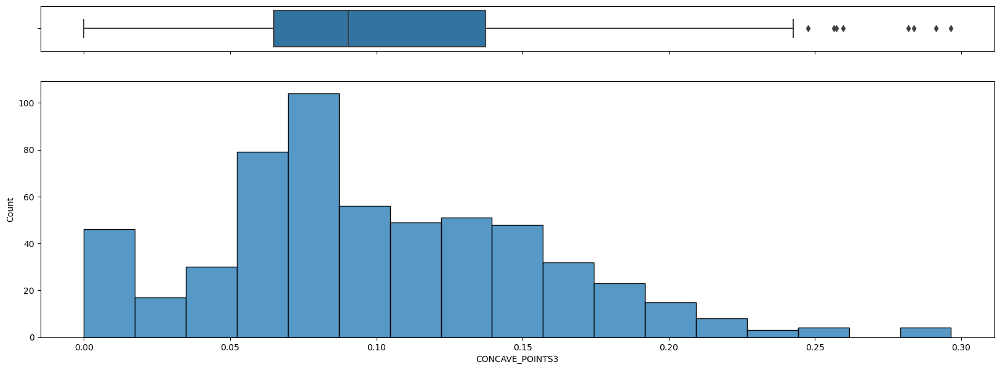

---

## *SYMMETRY3 - numeric*

,
Number of unique values,381
Sum,159.09
Mean,0.28
Mode,0.23
Standard deviation,0.05
Mean absolute deviation,0.03
Median absolute deviation,0.03
Coefficient of variation,0.16
Kurtosis,4.24
Skewness,1.04


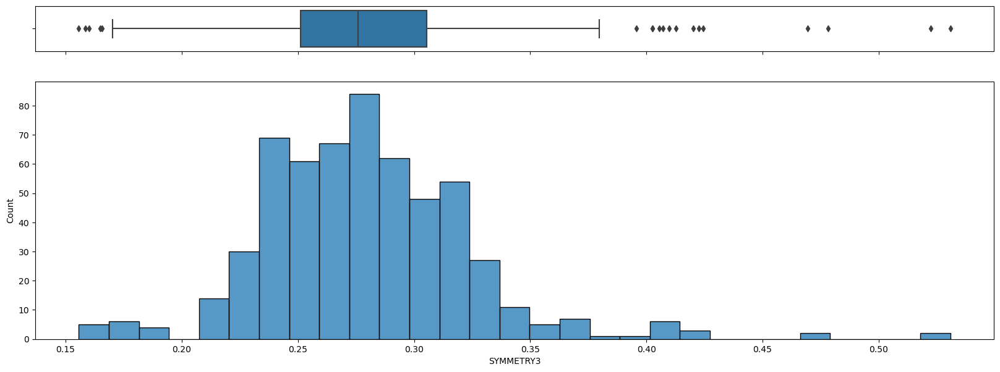

---

## *FRACTAL_DIMENSION3 - numeric*

,
Number of unique values,344
Sum,48.03
Mean,0.08
Mode,0.07
Standard deviation,0.02
Mean absolute deviation,0.01
Median absolute deviation,0.01
Coefficient of variation,0.20
Kurtosis,2.19
Skewness,1.21


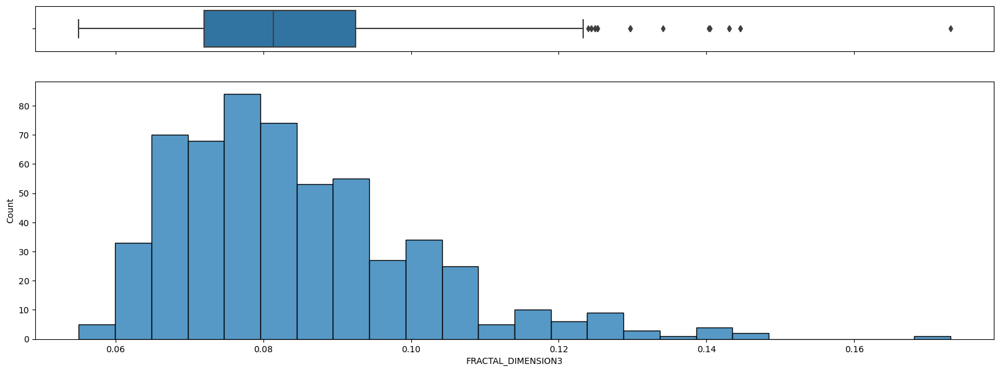

---

# Bivariate analysis<a id='3f1d993e-64b7-4986-810d-5c93d686bf15'>
---

## Correlation Plot<a id='5bc70824-fd61-4014-9496-3a648ab7aa24'>

### Pearson Correlation

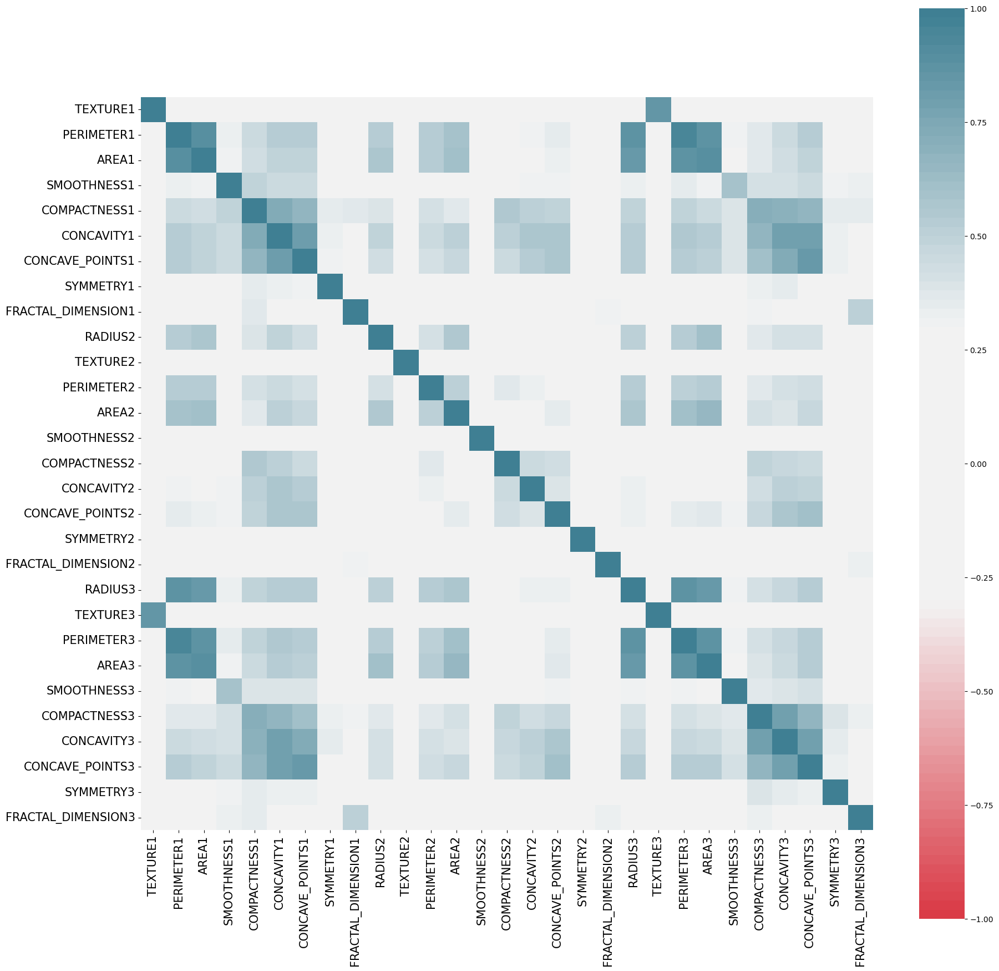

### Spearman Correlation

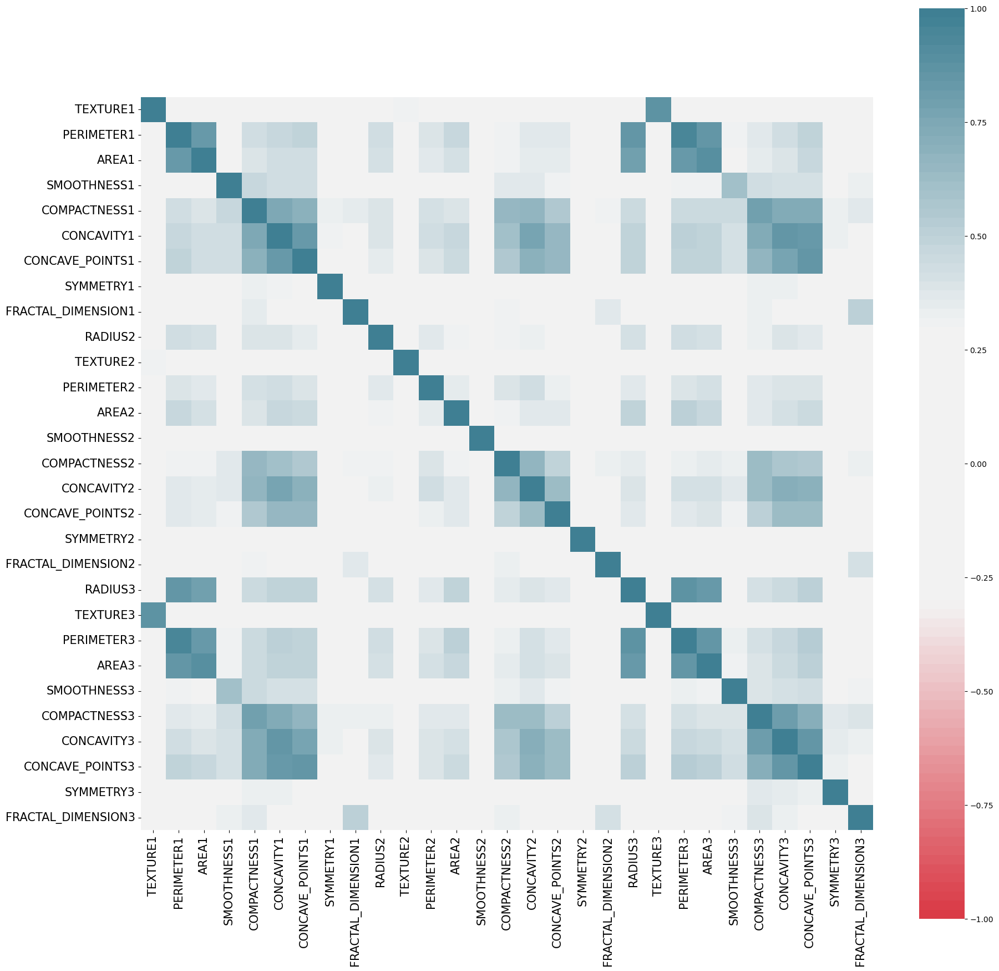

### Kendall Correlation

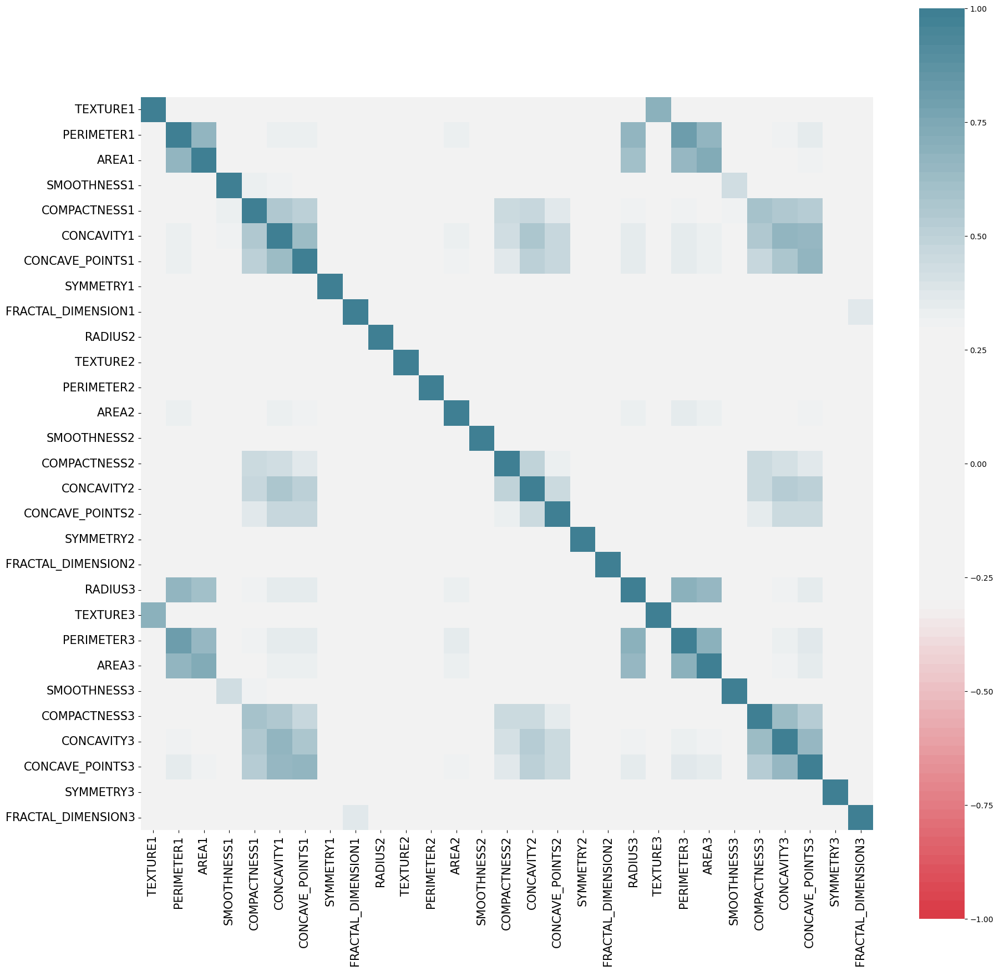

## Pairplot<a id='6e0da936-ccf6-4cd2-af66-13919cb994dd'>

/Users/krishnadave/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/krishnadave/anaconda3/lib/python3.11/site-packages/edvart/report_sections/bivariate_analysis.py:728: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


## Contingency table<a id='25591712-f3b1-4632-8391-7701136f2b50'>

# Multivariate analysis<a id='9a09bf63-8e31-41db-804b-73fcf013f5f5'>
---

## Principal Component Analysis<a id='02f85f2f-0d79-424f-a506-49935f065938'>

### First vs second principal component

Explained variance ratio: 46.00%


### Explained variance ratio

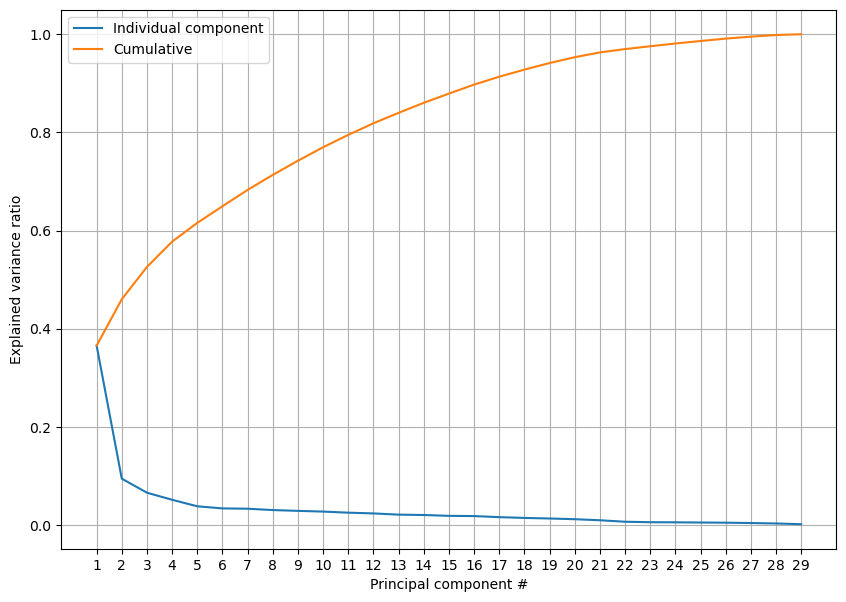

## Parallel coordinates<a id='73cd7e39-cc94-40ff-bf27-462b7440a337'>

## Parallel categories<a id='a6aca5e7-38d8-424a-95fc-22928a5e01df'>

In [11]:
createEDAReport(breastCancerData_beGreat)